# Data Mining

Here is the process for this Notebook:
- Why Data Mining?
- Clustering with KMeans
- [Silhouette Analysis](https://scikit-learn.org/stable/auto_examples/cluster/plot_kmeans_silhouette_analysis.html#sphx-glr-auto-examples-cluster-plot-kmeans-silhouette-analysis-py)


## Why Data Mining?
___
Data Mining is the process of identifying patterns to use them for insights and predictions. This aligns with the current project's objective to find relationships between job postings to help data science practicioners in their job search. Detecting patterns is important because there is no clear target. 

Initially, I thought that job_titles might have been a good route for finding a target. Through EDA, I found that a majority of the collected job titles were unique. From a human perspective, the wide differences in job titles adds to the complexity of job searching. 

Some inferred features for separating clusters include educational requirements, skills, and job level (e.g. Junior Data Scientist). 

In [30]:
# Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import pickle

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import MiniBatchSparsePCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.metrics import silhouette_score

In [2]:
# Import dataframe with cleaned job postings
postings = pd.read_csv('../data/postings/postings.csv', index_col='id')
postings.info()

<class 'pandas.core.frame.DataFrame'>
Index: 47915 entries, I0000 to M9066
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   job_title     47915 non-null  object
 1   job_docs      47915 non-null  object
 2   job_type      10000 non-null  object
 3   category      9118 non-null   object
 4   job_board     9310 non-null   object
 5   company_name  38845 non-null  object
 6   city          38599 non-null  object
 7   state         38432 non-null  object
 8   url           19067 non-null  object
 9   full_desc     47915 non-null  object
 10  pos_docs      47915 non-null  object
dtypes: object(11)
memory usage: 4.4+ MB


## Set X as vectorized 
___

In [3]:
tvec = TfidfVectorizer(max_features=10_000,
                       ngram_range=(1,2), 
                       min_df=5, 
                       max_df=0.85, 
                       stop_words='english')
X_tvec = tvec.fit_transform(postings['job_docs'])

In [4]:
ss = StandardScaler()
X_scaled = ss.fit_transform(X_tvec.toarray())

In [5]:
pca = MiniBatchSparsePCA(n_components=2, random_state=1)

In [6]:
X = pca.fit_transform(X_scaled)

In [7]:
X.shape

(47915, 2)

## Finding the Optimal Clusters
___

In [8]:
#Clustering Algorithm
evaluation = pd.DataFrame(columns=['distance', 'k', 'cluster_sizes', 'inertia', 'silhouette'])
n_clusters = range(2, 6)

for k in n_clusters:
    # Initialize and fit cluster to vectorized data
    kmeans = KMeans(n_clusters=k, init='k-means++', max_iter=100, n_init=10, random_state=k)
    
    # Fit clustering model
    kmeans.fit(X)
    
    # Calculate values to add to evaluation dataframe
    cluster_ids, cluster_sizes = np.unique(kmeans.labels_, return_counts=True)
    inertia = kmeans.inertia_
    sil = silhouette_score(X, kmeans.labels_)
    postings['predictions'] = kmeans.predict(X)
    
    evaluation.loc[len(evaluation)] = ['euclidian', k, cluster_sizes, inertia, sil] 

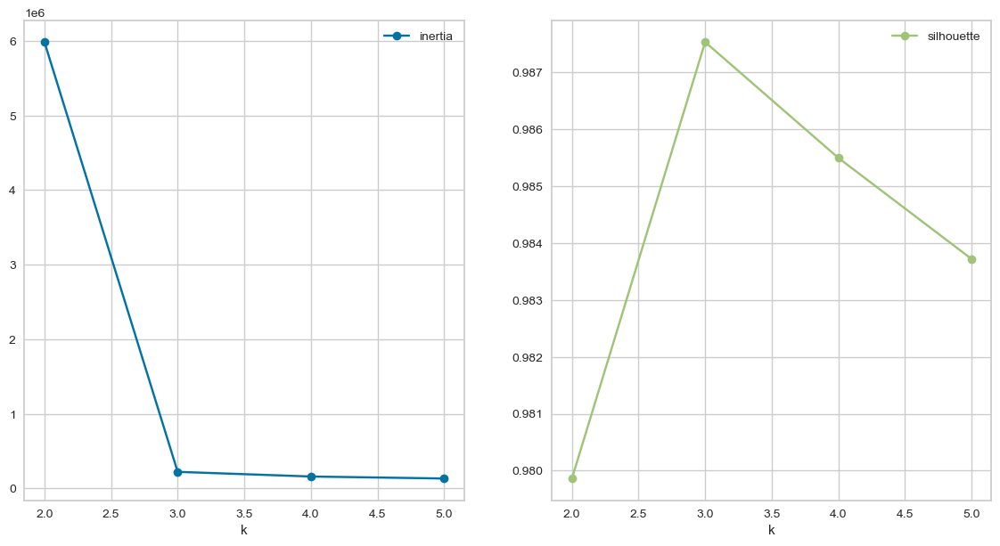

In [9]:
evaluation[['k', 'inertia', 'silhouette']].plot(x='k', subplots=True, layout=(1,2), figsize=(14,7), marker='o')
plt.savefig('../results/kmeans_eval.png')
plt.show();

Using the elbow method, I see that the rate of change in distances between clusters slow down around the 3 cluster point. This is reflected in the highest silhouetter score of over 0.987 in the second graph sitting at 3.0, too. This indicates that there are larger intercluster distancing.

## Clustering
___

Adapted from: https://hub.packtpub.com/create-machine-learning-pipelines-using-unsupervised-automl/

In [10]:
class Unsupervised_AutoML:
    def __init__(self, estimators=None, transformers=None):
        self.estimators = estimators
        self.transformers = transformers
        pass

    def fit_predict(self, X, y=None):
        """
        fit_predict will train given estimator(s) 
        and predict cluster membership for each sample
        """

        # This dictionary will hold predictions for each estimator
        predictions = []
        performance_metrics = {}

        for estimator in self.estimators:
            labels = estimator['estimator'](*estimator['args'], **estimator['kwargs']).fit_predict(X)
            estimator['estimator'].n_clusters_ = len(np.unique(labels))
            metrics = self._get_cluster_metrics(estimator['estimator'].__name__, estimator['estimator'].n_clusters_, X, labels, y)
            predictions.append({estimator['estimator'].__name__: labels})
            performance_metrics[estimator['estimator'].__name__] = metrics

            self.predictions = predictions
            self.performance_metrics = performance_metrics

            return predictions

    # Printing cluster metrics for given arguments
    def _get_cluster_metrics(self, name, n_clusters_, X, pred_labels, true_labels=None):
        from sklearn.metrics import silhouette_score

        print("""################## %s metrics #####################""" % name)
        if len(np.unique(pred_labels)) >= 2:
            
            silh_euc = silhouette_score(X, pred_labels, metric='euclidean', random_state=1)
            silh_cos = silhouette_score(X, pred_labels, metric='cosine', random_state=2)

            metrics = {"Silhouette Coefficient with euclidian distances": silh_euc,
                       "Silhouette Coefficient with cosine distances": silh_cos,
                       "Estimated number of clusters": n_clusters_}

            for k, v in metrics.items():
                print("%s: %0.3f" % (k, v))

            return metrics

        else:
            print("t# of predicted labels is {}, can not produce metrics. n".format(np.unique(pred_labels)))

### KMeans

In [11]:
estimators = [{'estimator': KMeans, 'args':(), 'kwargs':{'n_clusters': 3}}]

unsupervised_learner = Unsupervised_AutoML(estimators)

In [12]:
unsupervised_learner.estimators

[{'estimator': sklearn.cluster._kmeans.KMeans,
  'args': (),
  'kwargs': {'n_clusters': 3}}]

In [13]:
kmeans = unsupervised_learner.fit_predict(X)

/Users/kaitcrawford/opt/anaconda3/lib/python3.9/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


################## KMeans metrics #####################
Silhouette Coefficient with euclidian distances: 0.988
Silhouette Coefficient with cosine distances: 0.628
Estimated number of clusters: 3.000


### DBSCAN

In [14]:
estimators = [{'estimator': DBSCAN, 'args':(), 'kwargs':{'eps': 0.5}}]

unsupervised_learner = Unsupervised_AutoML(estimators)

dbscan = unsupervised_learner.fit_predict(X)

################## DBSCAN metrics #####################
Silhouette Coefficient with euclidian distances: 0.977
Silhouette Coefficient with cosine distances: 0.605
Estimated number of clusters: 39.000


In [15]:
estimators = [{'estimator': DBSCAN, 'args':(), 'kwargs':{'eps': 1.0}}]

unsupervised_learner = Unsupervised_AutoML(estimators)

dbscan = unsupervised_learner.fit_predict(X)

################## DBSCAN metrics #####################
Silhouette Coefficient with euclidian distances: 0.818
Silhouette Coefficient with cosine distances: 0.592
Estimated number of clusters: 21.000


In [16]:
estimators = [{'estimator': DBSCAN, 'args':(), 'kwargs':{'eps': 1.5}}]

unsupervised_learner = Unsupervised_AutoML(estimators)

dbscan = unsupervised_learner.fit_predict(X)

################## DBSCAN metrics #####################
Silhouette Coefficient with euclidian distances: 0.979
Silhouette Coefficient with cosine distances: 0.616
Estimated number of clusters: 12.000


In [17]:
estimators = [{'estimator': DBSCAN, 'args':(), 'kwargs':{'eps': 2}}]

unsupervised_learner = Unsupervised_AutoML(estimators)

dbscan = unsupervised_learner.fit_predict(X)

################## DBSCAN metrics #####################
Silhouette Coefficient with euclidian distances: 0.979
Silhouette Coefficient with cosine distances: 0.609
Estimated number of clusters: 12.000


I stopped iterating with new epsilon values after producing the same number of clusters using eps=1.5 and eps=2.

## Cluster Analysis with KMeans Labels from `n_clusers=3`
___

In [18]:
# Initialize and fit cluster to vectorized data
kmeans = KMeans(n_clusters=3, init='k-means++', max_iter=100, n_init=10, random_state=3)
    
# Fit clustering model
X_kmeans = kmeans.fit(X)

KMeans(max_iter=100, n_clusters=3, n_init=10, random_state=3)

In [19]:
# Convert X_train into a DataFrame.
cluster_df = pd.DataFrame(X, index=postings.index)

In [20]:
# update df with the new labels and view the pairplot
cluster_df['kmeans_cluster'] = kmeans.labels_

In [21]:
df = cluster_df.merge(postings, left_index=True, right_index=True)

In [22]:
import plotly.express as px

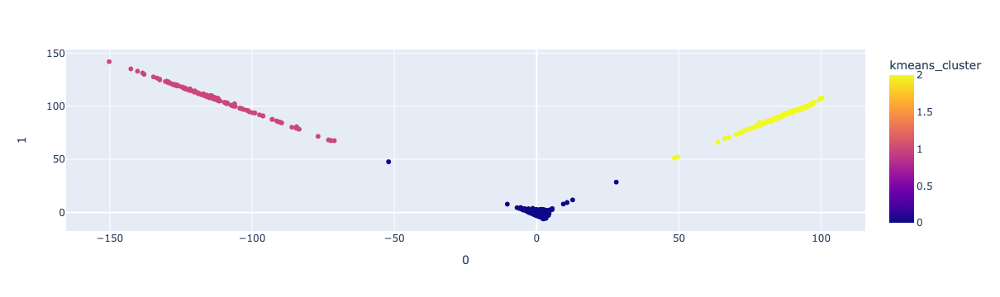

In [50]:
px.scatter(df, x=0, y=1, hover_data=['job_title', 'city', 'state'], color='kmeans_cluster', 
           color_discrete_sequence=["blue", "goldenrod", "green"],)

The intercluster distances using k=3 are clearly show. However there are a few points that sit inbetween the to dispersed arms of the 'v' shape.

In [24]:
# Convert X_train into a DataFrame.
words_df = pd.DataFrame(X_tvec.todense(), columns=tvec.get_feature_names_out())
words_df['kmeans_cluster'] = kmeans.labels_

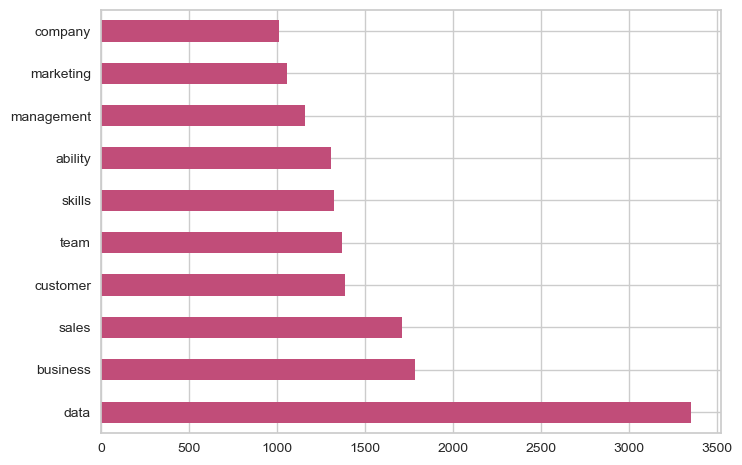

In [63]:
# plot top occuring words
fig0 = words_df.loc[words_df['kmeans_cluster'] == 0].drop(columns=['kmeans_cluster']).sum().sort_values(ascending=False).head(10).plot(kind='barh', color="#C14D79")
plt.savefig('../results/fig0.png')
plt.show();

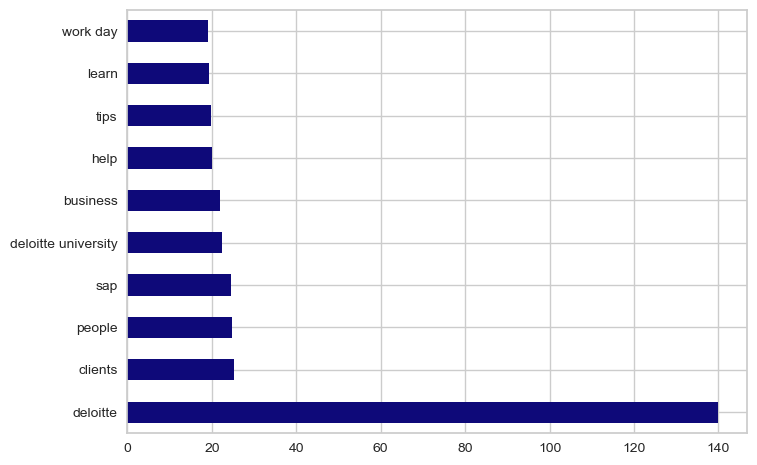

In [64]:
# plot top occuring words
fig1 = words_df.loc[words_df['kmeans_cluster'] == 1].drop(columns=['kmeans_cluster']).sum().sort_values(ascending=False).head(10).plot(kind='barh', color='#0E0979')
plt.savefig('../results/fig1.png')
plt.show();

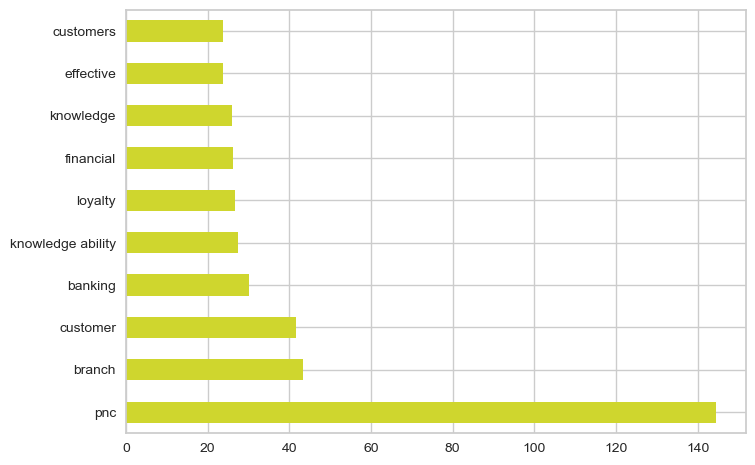

In [67]:
# plot top occuring words
fig2 = words_df.loc[words_df['kmeans_cluster'] == 2].drop(columns=['kmeans_cluster']).sum().sort_values(ascending=False).head(10).plot(kind='barh', color='#CFD62E')
plt.savefig('../results/fig2.png')
plt.show()

There is no clear industry, education level, or qualification that is drawn from the last three plots of the top ngrams in the three KMeans clusters. I will try to udnerstand their differences through job title.

In [73]:
df.groupby('kmeans_cluster')[['job_title', 'kmeans_cluster']].sample(3)

,job_title,kmeans_cluster
id,,
M3093,machine learning scientist- platforms,0
I0322,receptionist part time - alfa romeo maserati w...,0
I0741,senior talent acquisition partner,0
I11741,cyber identity & access management senior cons...,1
I23477,kronos workforce management senior manager,1
I16988,cyber sap/grc business process controls manager,1
I0528,relationship mgr i,2
I20269,brnch sls&srvcassoc i(u)(mlo) teller/personal ...,2
I0196,branch sales and service representattive (mlo)...,2


After randomly sampling several times, I see that there are three groups I could define:
1. a mix of sales and technical positions
2. specializations and managerial roles
3. sales and finance industries

# Topic Modeling
___

In [ ]:
def plot_top_words(model, feature_names, n_top_words, title):
    fig, axes = plt.subplots(2, 6, figsize=(30, 15), sharex=True)
    axes = axes.flatten()
    for topic_idx, topic in enumerate(model.components_):
        top_features_ind = topic.argsort()[: -n_top_words - 1 : -1]
        top_features = [feature_names[i] for i in top_features_ind]
        weights = topic[top_features_ind]

        ax = axes[topic_idx]
        ax.barh(top_features, weights, height=0.7, color="#0E0979")
        ax.set_title(f"Topic {topic_idx +1}", fontdict={"fontsize": 30})
        ax.invert_yaxis()
        ax.tick_params(axis="both", which="major", labelsize=20)
        for i in "top right left".split():
            ax.spines[i].set_visible(False)
        fig.suptitle(title, fontsize=40)

    plt.subplots_adjust(top=0.90, bottom=0.05, wspace=0.90, hspace=0.3)

In [ ]:
def fit_lda(X, n):
    figures = []
    # Instantiate LDA Model
    lda = LatentDirichletAllocation(
        n_components=n,
        max_iter=5,
        learning_method="online",
        learning_offset=50.0,
        random_state=n,
    )

    # Fit LDA Model on training data
    X_lda = lda.fit(X)

    tf_feature_names = tvec.get_feature_names_out()
    fig = plot_top_words(lda, tf_feature_names, 10, "Key Words in LDA model")
    
    return lda, figures

In [ ]:
lda_models = {}
lda_plots = {}

for n in range(3, 12):
    lda, figures = fit_lda(X_tvec, n)
    lda_models[n] = lda
    lda_plots[n] = figures